<a href="https://colab.research.google.com/github/RubenCedillo123/F-sica---UNAM/blob/main/CedilloRuben_Algo_T03.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Librerías***

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# ***Ejercicio 2***

Hacer un programa en Python que implemente los métodos de método de Euler y Runge-Kutta de orden 4 para resolver

  $$
  y' = t^2 + \frac{1}{2}\text{,} \quad \text{con} \quad 0\leq t\leq 1\quad \text{y} \quad y(0)=1, h=0.1
  $$

  ¿Hay alguna diferencia en las soluciones? Explicar la respuesta.

## ***Método de Euler***

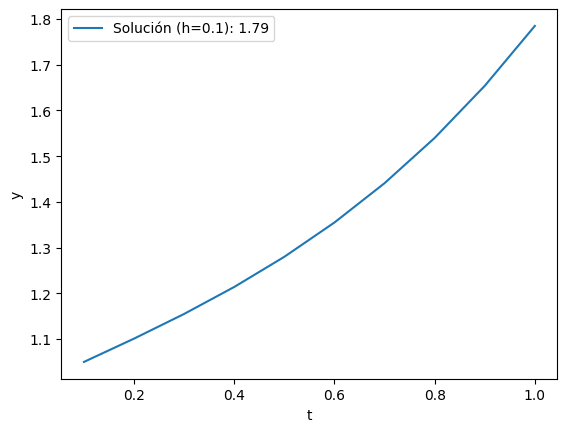

In [ ]:
#definimos nuestra EDO
def f(t, y):
  return t**2 + 0.5

#La longitud de los pasos
h = 0.1

#Listas de soluciones y pasos
y_euler = []
t_euler = []

#Límites y conduciones iniciales de la EDO
t_min = 0
t_max = 1
y_0 = 1

#Método de Euler
t = t_min
y = y_0
while t < t_max - 1e-9: #Ajustar para el error del punto flotante
  y = y + h*f(t, y)
  t = round(t+h, 10)
  y_euler.append(y)
  t_euler.append(t)

#Visualización
plt.plot(t_euler, y_euler, label=f"Solución (h=0.1): {y_euler[-1]:.2f}")
plt.xlabel('t')
plt.ylabel('y')
plt.legend()
plt.show()

## ***Método de Runge-Kutta de Orden 4***

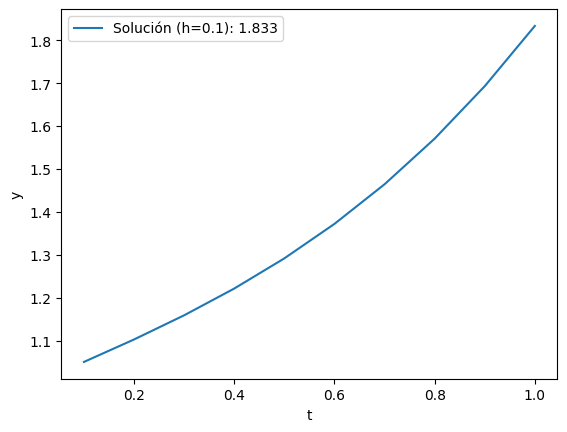

In [ ]:
#Listas para almacenar los resultados
y_rk4 = []
t_rk4 = []

#Método RK4
def RK4(f, t_0, y_0, h, pasos):
    t, y = t_0, y_0
    for i in range(pasos):
        k_1 = h*f(t, y)
        k_2 = h*f(t + h/2, y + k_1)
        k_3 = h*f(t + h/2, y + k_2)
        k_4 = h*f(t + h, y + k_3)
        y += 1/6 * (k_1 + 2*k_2 + 2*k_3 + k_4)
        t += h
        y_rk4.append(y)
        t_rk4.append(t)
    return y

sol_RK4 = RK4(f, 0, 1, 0.1, 10)

#Visualización

plt.plot(t_rk4, y_rk4, label=f"Solución (h=0.1): {y_rk4[-1]:.3f}")
plt.xlabel('t')
plt.ylabel('y')
plt.legend()
plt.show()

## ***Solución Análitica y Comparación***

In [ ]:
y0 = [1.0]  # y(0) = 1
t_span = (0.0, 1.0)  # Intervalo de t

# Resolver usando solve_ivp
sol = solve_ivp(f, t_span, y0, t_eval=np.arange(0, 1.01, 0.1), dense_output=True)

#Sol para y(1)
y_analitica = sol.sol(1.0)[0]

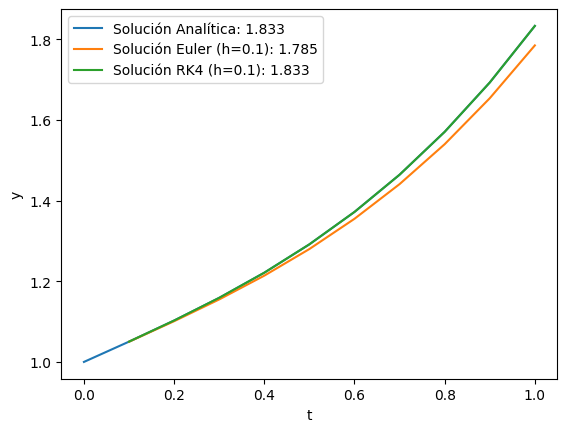

In [ ]:
plt.plot(sol.t, sol.y[0], label=f'Solución Analítica: {y_analitica:.3f}')
plt.plot(t_euler, y_euler, label=f"Solución Euler (h=0.1): {y_euler[-1]:.3f}")
plt.plot(t_rk4, y_rk4, label=f"Solución RK4 (h=0.1): {y_rk4[-1]:.3f}")
plt.xlabel('t')
plt.ylabel('y')
plt.legend()
plt.show()

### ***Errores***

In [ ]:
e_1 = abs(y_analitica - y_euler[-1])*100
e_2 = abs(y_analitica - y_rk4[-1])*100
print(f"Error Euler: {e_1:.3f}%")
print(f"Error RK4: {e_2:.3f}%")

Error Euler: 4.833%
Error RK4: 0.000%


## ***Análisis***

* Podemos observar que el método RK4 es ampliamente más preciso que el método RK1 (Euler).

* Vemos que ya con el método RK4 y con pocos pasos (10) ya se obtiene una precisión altisima, ¡con un error relativo del 0.00%! a comparación del método de Euler que tiene un error relativo del 4.833%, que tambien es bueno.

* ¿Cuál es la razón de la diferencia entre las soluciones?

  + El método RK4 utiliza terminos del desarrollo de Taylor 3 puntos más de información del cambio de la pendiente que el método RK1

  + RK1 ignora el comportamiento de la pendiente dentro del intervalo $[t_n, t_{n+1}]$ que implica una acumulación en el error de local y global, los cuales son:

    + RK1 (ELT): $O(h^2)$
    + RK1 (EGT) : $O(h)$

  + A pesar de ser buenas aproximaciones, relativamente son malas, ya que esto equivale a tratar con polinomio de Taylor de 1° orden, a comparación de RK4 que equivale a trabajar con polinomio de Taylor de 4° orden:

    + RK4 (ELT): $O(h^5)$
    + RK4 (EGT) : $O(h^4)$


# ***Ejercicio 4***

Hacer un programa en Python que calcule la solución para el problema de un resorte amortiguado

$$
y'' + 4y = sen(2t)
\quad
\text{con}
\quad
y(0)= 0
\quad
\text{y}
\quad
y'(0)=1
$$

en el intervalo $[0,5]$ con un paso $h=0.1$

## ***Solución Mediante Método RK4***

* Primeramente debemos plantear el sistema ecuaciones de la ecuación de segundo grado dada en el problema. Renombramos las incognitas:

   $$\left\{ y_1 = y \quad \rightarrow \quad y_1' = y' = y_2 \atop y_2 = y' \quad \rightarrow \quad y_2' = y'' = sen(2t) - 4y  \right.$$

+ Entonces el sistema de ecuaciones y las condiciones inciales renombradas son:

  $$
  \left\{
  y_1' = y_2 \quad \rightarrow \quad y_1 (0)=0
  \atop
  y_2' = sen(2t) - 4y_1 \quad \rightarrow \quad y_2(0)=1
  \right.
  $$

+ Con esto ahora es posible hallar la solución para el sistema de ecuciones en "$5$". Utilizaré el método Runge-Kutta de orden 4.

In [ ]:
#pasos
h_4 = 0.1
st_min, st_max =0,  5

#listas para guardar cada actualización
sy_1, sy_2, st = [], [], []

#condiciones iniciales
sy1_0, sy2_0 = 0, 1

#funciones
def f_1(t, y_1, y_2):
  return y_2

def f_2(t, y_1, y_2):
  return np.sin(2*t) - 4*y_1

In [ ]:
#Algortimo del método RK4 para un sistema de dos ecuaciones
def sol_RK4_S2 (f_1, f_2, t_0, y_1, y_2, h, a, b):
  t, N = t_0, int((b-a)/h)
  for i in range(N):
    k_1_1 = h*f_1(t, y_1, y_2)
    k_1_2 = h*f_2(t, y_1, y_2)

    k_2_1 = h*f_1(t + h/2, y_1 + k_1_1/2, y_2 + k_1_2/2)
    k_2_2 = h*f_2(t + h/2, y_1 + k_1_1/2, y_2 + k_1_2/2)

    k_3_1 = h*f_1(t + h/2, y_1 + k_2_1/2, y_2 + k_2_2/2)
    k_3_2 = h*f_2(t + h/2, y_1 + k_2_1/2, y_2 + k_2_2/2)

    k_4_1 = h*f_1(t + h, y_1 + k_3_1, y_2 + k_3_2)
    k_4_2 = h*f_2(t + h, y_1 + k_3_1, y_2 + k_3_2)

    y_1 += 1/6 * (k_1_1 + 2*k_2_1 + 2*k_3_1 + k_4_1)
    y_2 += 1/6 * (k_1_2 + 2*k_2_2 + 2*k_3_2 + k_4_2)
    t += h

    sy_1.append(y_1)
    sy_2.append(y_2)
    st.append(t)

  return y_1, y_2

#Solucion
sol_RK4_S2(f_1, f_2, 0, sy1_0, sy2_0, h_4, st_min, st_max)

(np.float64(0.708898169121462), np.float64(-2.199008159197472))

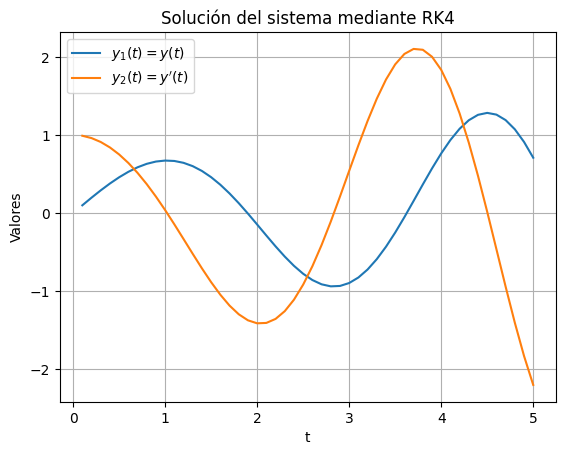

In [ ]:
# Visualización
plt.plot(st, sy_1, label='$y_1(t) = y(t)$')
plt.plot(st, sy_2, label="$y_2(t) = y'(t)$")
plt.xlabel('t')
plt.ylabel('Valores')
plt.title('Solución del sistema mediante RK4')
plt.legend()
plt.grid(True)
plt.show()

### Si es necesario reejecutar el código usar:

In [ ]:
#sy_1.clear()
#sy_2.clear()
#st.clear()

## ***Resolución con Scipy***

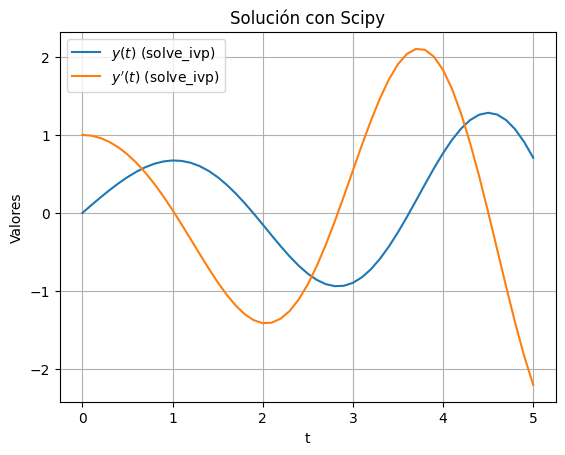

In [ ]:
def sistema(t, y):
    y1, y2 = y
    dy1dt = y2
    dy2dt = np.sin(2*t) - 4*y1
    return [dy1dt, dy2dt]

# Condiciones iniciales
y0 = [0, 1]
t_span = (0, 5)
t_eval = np.arange(0, 5.1, 0.1)

# Resolver con solve_ivp
sol = solve_ivp(sistema, t_span, y0, t_eval=t_eval, method='RK45')

# Visualizar
plt.plot(sol.t, sol.y[0], label='$y(t)$ (solve_ivp)')
plt.plot(sol.t, sol.y[1], label="$y'(t)$ (solve_ivp)")
plt.xlabel('t')
plt.ylabel('Valores')
plt.title('Solución con Scipy')
plt.legend()
plt.grid(True)
plt.show()

## ***Comparación***



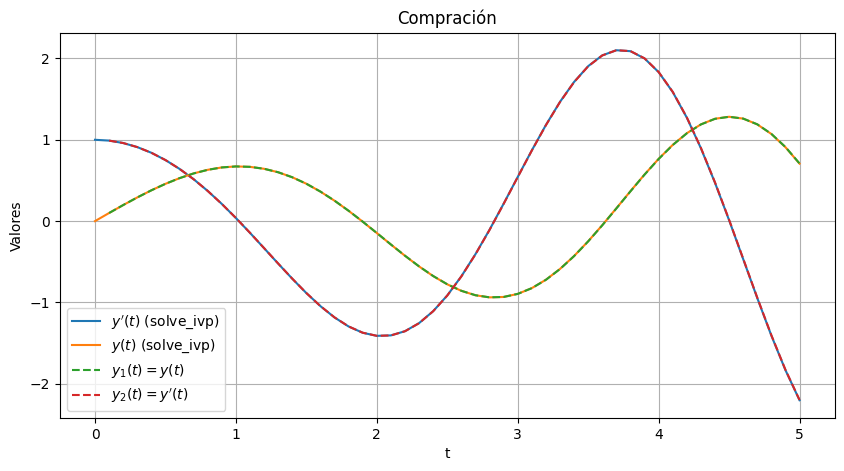

In [ ]:
#Visualizar comparación
plt.figure(figsize=(10,5))


plt.plot(sol.t, sol.y[1], label="$y'(t)$ (solve_ivp)")
plt.plot(sol.t, sol.y[0], label='$y(t)$ (solve_ivp)')
plt.plot(st, sy_1, label='$y_1(t) = y(t)$', linestyle='--')
plt.plot(st, sy_2, label="$y_2(t) = y'(t)$", linestyle='--')

plt.xlabel('t')
plt.ylabel('Valores')
plt.title('Comparación')
plt.legend()
plt.grid(True)
plt.show()

# ***Ejercicio 5***

+ El objetivo de este ejercicio es calcular el cociente *señal a ruido* de una señal dada.

+ Tal como ocurre en la integración por MonteCarlo, se utiliza preferentemente un promedio de tal manera que la integral original se transforma en una cantidad mucho más fácil de calcular.

+ Dada una señal continua en el tiempo $x(t)$, la energía de la señal se define como

$$
E = \int |x(y)|^2dx
$$

+ En el dominio discreto, si se tienen muestras $x[n]$ de la señall, la energía se aroxima como

$$
E \approx \sum_{n=0}^{N-1} x[n]^2
$$

+ Para señales de duración indefinida (o para una señal periódica), se prefiere la *potencia promedio*. Para una señal discreta, la potencia promedio se calcula como

$$
P = \frac{1}{N} \sum_{n=0}^{N-1} x[n]^2
$$

+ Hacer un programa en Python que haga lo siguiente:

## ***Inciso a)***

* Lea el archivo ```signal1.wav.```



In [ ]:
#Conectar con google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#librería que leera el archivo .wav
from scipy.io import wavfile

#Leer archivo .wav
fs, data = wavfile.read("/content/drive/MyDrive/Colab Notebooks/Algoritmos /Tarea 3/signal1.wav")

In [ ]:
#La escuchamos unicamente
from IPython.display import Audio

# La hacemos monocanal
if data.ndim > 1:
    data1 = data.mean(axis=1)

# Normalizar la señal a [-1, 1]
data1 = data1.astype(np.float32)
data1 /= np.max(np.abs(data1))

Audio(data1, rate=fs)

## ***Inciso b)***

+ Agregue una señal simulada de *ruido Gaussiano* (datos aleatorios provenientes de una distribución normal) mediante un factor de escalamiento.

+ Por ejemplo, 0.05 significa que la desviación estándar del ruido es el 5 % de la amplitud máxima de la señal limpia y media cero. Los porcentajes son 5, 10, 15, 20 %.

+ Se debe generar como
salida cada uno de los archivos con el ruido correspondiente.

In [ ]:
#librería que se utiliza para guardar arrays de NumPy
#como archivos de audio en formato WAV
from scipy.io.wavfile import write

# Escalar al rango original int16 para guardar después
#(para escucharla en el colab modificamos su escala)
def float_to_int16(signal):
    return np.int16(signal / np.max(np.abs(signal)) * 32767)

#Salida
salida = "/content/drive/MyDrive/Colab Notebooks/Algoritmos /Tarea 3/"

In [ ]:
# Generar y guardar señales con diferentes niveles de ruido
for percent in [5, 10, 15, 20]:
    noise_level = percent / 100
    std_noise = noise_level * np.max(np.abs(data))

    # Generar ruido Gaussiano
    ruidog = np.random.normal(0, std_noise, data.shape)

    # Lo agregamos a la señal orginal
    audio_r = data + ruidog

    # Normalizar para evitar saturación
    audio_r = audio_r / np.max(np.abs(audio_r))

    # Convertir a int16 para guardar como .wav
    audio_r_int16 = float_to_int16(audio_r)

    # Nombre del archivo
    filename = f"signal1_ruido_{percent}.wav"

    # Guardar archivo
    write(salida + filename, fs, audio_r_int16)

    print(f"Archivo generado: {filename}")

Archivo generado: signal1_ruido_5.wav
Archivo generado: signal1_ruido_10.wav
Archivo generado: signal1_ruido_15.wav
Archivo generado: signal1_ruido_20.wav


In [ ]:
#Escuchamos desde el colab
fs_5, data_5 = wavfile.read("/content/drive/MyDrive/Colab Notebooks/Algoritmos /Tarea 3/signal1_ruido_5.wav")
fs_10, data_10 = wavfile.read("/content/drive/MyDrive/Colab Notebooks/Algoritmos /Tarea 3/signal1_ruido_10.wav")
fs_15, data_15 = wavfile.read("/content/drive/MyDrive/Colab Notebooks/Algoritmos /Tarea 3/signal1_ruido_15.wav")
fs_20, data_20 = wavfile.read("/content/drive/MyDrive/Colab Notebooks/Algoritmos /Tarea 3/signal1_ruido_20.wav")

fs_l = [fs_5, fs_10, fs_15, fs_20]
data_l = [data_5, data_10, data_15, data_20]
porcentajes = [5, 10, 15, 20]

for i in range(4):
  if data_l[i].ndim > 1:
    data_l[i] = data_l[i].mean(axis=1)

  data_l[i] = data_l[i].astype(np.float32)
  data_l[i] /= np.max(np.abs(data_l[i]))

  print(f"\n Señal con {porcentajes[i]}% de ruido:")
  display(Audio(data_l[i], rate=fs_l[i]))


 Señal con 5% de ruido:



 Señal con 10% de ruido:



 Señal con 15% de ruido:



 Señal con 20% de ruido:


## ***Inciso c)***

* Para cada uno de los porcentajes del inciso anterior calcular el cociente señal a ruido (SNR):

$$
10log_{10}\left(\frac{P_{señal} }{P_{ruido}}\right)
$$

In [ ]:
# Lista para guardar los resultados de SNR
snrs = []

# Hacemos la señal original que este en el mismo formato que las ruidosas
original = data1[:len(data_l[0])]

for i, ruido in enumerate(data_l):
    ruido_residual = ruido - original
    P_señal = np.mean(original**2)
    P_ruido = np.mean(ruido_residual**2)
    snr = 10 * np.log10(P_señal / P_ruido)
    snrs.append(snr)
    print(f"SNR con {porcentajes[i]}% de ruido: {snr:.2f} dB")

SNR con 5% de ruido: 13.48 dB
SNR con 10% de ruido: 7.89 dB
SNR con 15% de ruido: 4.85 dB
SNR con 20% de ruido: 3.36 dB


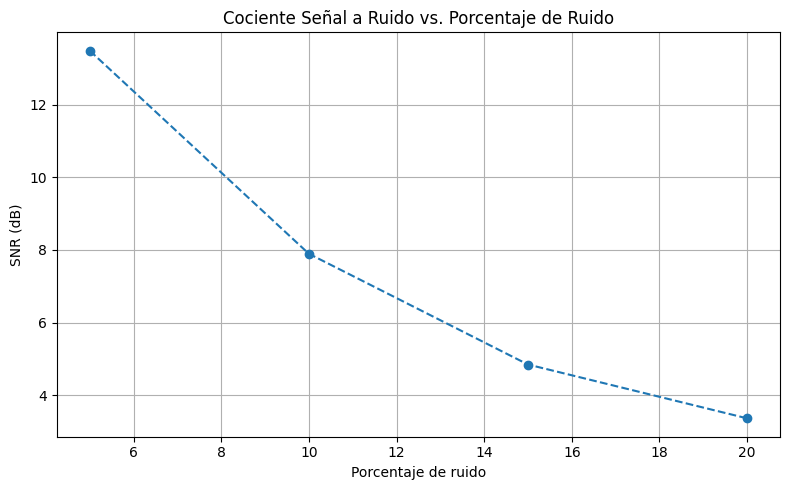

In [ ]:
# Graficamos
plt.figure(figsize=(8, 5))
plt.plot(porcentajes, snrs, marker='o', linestyle='--')
plt.xlabel('Porcentaje de ruido')
plt.ylabel('SNR (dB)')
plt.title('Cociente Señal a Ruido vs. Porcentaje de Ruido')
plt.grid(True)
plt.tight_layout()
plt.show()


## ***Inciso d)***

+ Discutir lo siguiente:

  + En términos cualitativos ¿qué puede afirmarse de la degradación de la señal conforme se aumenta el ruido y su SNR?

    + Al aumentar el ruido la señal se degrada, esto lo podemos medir con el SNR:

      + 5% SNR = 13.48dB, la señal predomina en lo auditivo
      + 10% SNR = 7.89dB, el ruido empieza a cubrir detalles del audio
      + 5% y 20%, con SNRs de 4.85 dB y 3.36 dB respectivamente el ruido ya domina el audio
    
    + El aumento de ruido implica una disminución del SNR que lleva a una degradación del audio

  + ¿Cuantas veces aumenta proporcionalmente el ruido respecto a la señal conforme se cambian los porcentajes?

    + El ruido al 10% es el doble del ruido al 5%.

    + El ruido al 15% es tres veces mayor que al 5%.

    + El ruido al 20% es cuatro veces mayor que al 5%

    + Esto significa que el ruido crece cuadráticamente con respecto a la desviación estándar, ya que la potencia está relacionada con la varianza del ruido. Por tanto, aunque los porcentajes se incrementen de manera lineal, la potencia del ruido aumenta más rápidamente, lo que disminuye el SNR de forma no lineal.